# HEAR THE WORLD

## Contents
1. import packages
1. Exploring the DataSet
1. Data Cleaning & Recunstruction
1. Modeling

## 1. Import Packages
- The below lists are packages in need for this project

In [1]:
import os
import re
import pickle
import string
from collections import Counter

from keras.preprocessing.image import load_img
from keras.preprocessing.image import img_to_array
from keras.preprocessing.text import Tokenizer
from keras.preprocessing.sequence import pad_sequences
from keras.utils import to_categorical

from keras.models import Model
from keras.layers import Input, Dense, Embedding, LSTM, Concatenate, Activation, Dropout, add

from keras.applications.vgg16 import preprocess_input
from keras.applications.vgg16 import VGG16

from keras.callbacks import TensorBoard

%matplotlib inline
%config InlineBackend.figure_format = 'retina'
import warnings
warnings.filterwarnings("ignore")

Using TensorFlow backend.


# 2. Explore Dataset

- There are two directories for Flcker8k_Dataset
    1. Flicker8k_Dataset
        - There are bunch of images only
    2. Flickr8k_text
        - It includes descriptions for each image, which filename: `Flickr8k.token.txt`
        - list of image filenames which filename: `Flickr_8k.trainImages.txt`, `Flickr_8k.testImages.txt`

In [2]:
!tree -d -C ./dataset

./dataset
├── Flicker8k_Dataset
├── Flickr8k_text
└── glove.6B

3 directories


In [3]:
! tree -C ./dataset/Flickr8k_text/

./dataset/Flickr8k_text/
├── CrowdFlowerAnnotations.txt
├── ExpertAnnotations.txt
├── Flickr8k.lemma.token.txt
├── Flickr8k.token.txt
├── Flickr_8k.devImages.txt
├── Flickr_8k.testImages.txt
├── Flickr_8k.trainImages.txt
└── readme.txt

0 directories, 8 files


### 2-1. Image
- We can touch each image through its filename

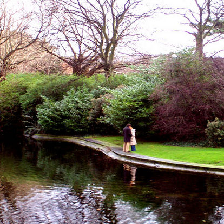

In [4]:
image = load_img('./dataset/Flicker8k_Dataset/3637013_c675de7705.jpg', target_size=(224, 224))
image

### 2-2. Descriptions

In [5]:
file = open('./dataset/Flickr8k_text/Flickr8k.token.txt', 'r')
documents = file.read(200)
file.close()
documents

'1000268201_693b08cb0e.jpg#0\tA child in a pink dress is climbing up a set of stairs in an entry way .\n1000268201_693b08cb0e.jpg#1\tA girl going into a wooden building .\n1000268201_693b08cb0e.jpg#2\tA lit'

## 3. DataCleaning & Recustruction

### 3-1. image load function
1. Steps
    - load
    - to array
    - ready data for VGG16

1. `read_text` 함수를 이용해 image 파일 명들을 read 합니다.
1. `load_images` 함수를 이용해 위에서 읽은 파일 제목들을 입력으로 넣고, Image Feature Extraction 을 위해서 VGG16 을 사용합니다.

In [2]:
def read_text(directory, file_name):
    with open(os.path.join(directory, file_name), 'r') as f:
        lines = f.read().splitlines()
    return lines

In [3]:
train_image_filenames = read_text('./dataset/Flickr8k_text', 'Flickr_8k.trainImages.txt')
test_image_filenames = read_text('./dataset/Flickr8k_text', 'Flickr_8k.testImages.txt')
print(len(train_image_filenames))
print(len(test_image_filenames))

6000
1000


In [4]:
def load_images(directory, filenames):
    images = dict()
    input_layer = Input(shape=(224, 224, 3))
    model = VGG16(include_top=True, input_tensor=input_layer, weights='imagenet')
    for filename in filenames:
        image = load_img(os.path.join(directory, filename), target_size=(224, 224))
        image = img_to_array(image)
        image = image.reshape((1, image.shape[0], image.shape[1], image.shape[2]))
        image = preprocess_input(image)
        image = model.predict(image)
        image = np.reshape(image, image.shape[1])
        images[filename] = image
    return images

In [ ]:
train_images_features = load_images('./dataset/Flicker8k_Dataset', train_image_filenames)
f = open('train_images_features.pkl', 'ab') 
pickle.dump(train_images_features, f)
f.close()
# dump(train_images_features, open('train_imagesfeatures.pkl', 'wb'))

In [ ]:
test_images_features = load_images('./dataset/Flicker8k_Dataset', test_image_filenames)
f = open('test_images_features.pkl', 'ab') 
pickle.dump(test_images_features, f)
f.close()
# dump(train_images_features, open('train_imagesfeatures.pkl', 'wb'))

In [60]:
list(train_images_features.items())[0][1].shape

(1000,)

In [4]:
objects = []
with open("./train_images_features.pkl", "rb") as openfile:
    while True:
        try:
            objects.append(pickle.load(openfile))
        except EOFError:
            break

In [5]:

train_images_features = objects.pop()
del objects

### 3-2. Text (Image Description)
- 한 이미지당 #0 #1 #2 #3 #4  5개의 Description 이 있는 것을 확인 할 수 있습니다.
- 전체 Description 을 로드하여 image 와 description 을 매칭해줍니다.
- 매칭할 때, description에 `STARTSEQ` 와 `ENDSEQ` 를 앞 뒤로 추가해줍니다. 이는 text modeling 을 진행할 때, model 입장에서 문장의 시작점과 끝점을 인식하게 해주기 위함입니다.

In [6]:
total_description_text = read_text('./dataset/Flickr8k_text', 'Flickr8k.token.txt')
print("전체 descriptions length: ", len(total_description_text))

전체 descriptions length:  40460


In [34]:
#6개 이상의 description 이 있다면, 확인하는 코드
pattern = re.compile('.*jpg#5')
for text in total_description_text:
    answer = pattern.match(text)
    if answer:
        print("There are more than 5 descriptions in image")
        break

In [7]:
def id_description(description_text):
    descriptions = {}
    for description in description_text:
        img_id = description.split('\t')[0].split('#')[0]
        img_description = description.split('\t')[1]
        if img_id not in descriptions:
            descriptions[img_id] = list()
        descriptions[img_id].append(img_description)
    return descriptions

In [8]:
total_image_to_descriptions_dict = id_description(total_description_text)
len(total_image_to_descriptions_dict)

8092

In [9]:
list(total_image_to_descriptions_dict.items())[:2]

[('1000268201_693b08cb0e.jpg',
  ['A child in a pink dress is climbing up a set of stairs in an entry way .',
   'A girl going into a wooden building .',
   'A little girl climbing into a wooden playhouse .',
   'A little girl climbing the stairs to her playhouse .',
   'A little girl in a pink dress going into a wooden cabin .']),
 ('1001773457_577c3a7d70.jpg',
  ['A black dog and a spotted dog are fighting',
   'A black dog and a tri-colored dog playing with each other on the road .',
   'A black dog and a white dog with brown spots are staring at each other in the street .',
   'Two dogs of different breeds looking at each other on the road .',
   'Two dogs on pavement moving toward each other .'])]

#### Eliminate punctuation, numbers
#### Make lowercase
- descriptions 중 punctuation과, 구성되어있는 숫자 등을 제거하고, 소문자로 만들어줍니다.

In [10]:
table = str.maketrans('', '', string.punctuation)

for key, captions in total_image_to_descriptions_dict.items():
    for index, caption in enumerate(captions):
        temp = caption.split()
        temp = [word.lower() for word in temp]
        temp = [word.translate(table) for word in temp]
        temp = [word for word in temp if word.isalpha()]
        captions[index] = ' '.join(temp)

In [11]:
list(total_image_to_descriptions_dict.items())[:2]

[('1000268201_693b08cb0e.jpg',
  ['a child in a pink dress is climbing up a set of stairs in an entry way',
   'a girl going into a wooden building',
   'a little girl climbing into a wooden playhouse',
   'a little girl climbing the stairs to her playhouse',
   'a little girl in a pink dress going into a wooden cabin']),
 ('1001773457_577c3a7d70.jpg',
  ['a black dog and a spotted dog are fighting',
   'a black dog and a tricolored dog playing with each other on the road',
   'a black dog and a white dog with brown spots are staring at each other in the street',
   'two dogs of different breeds looking at each other on the road',
   'two dogs on pavement moving toward each other'])]

#### 각 문장들을 단어별로 잘라, 단어장을 생성해줍니다.

In [12]:
corpus = set()
for _, descriptions in total_image_to_descriptions_dict.items():
    for description in descriptions:
        corpus.update(description.split())
corpus = list(corpus)
len(corpus)

8775

#### STARTSEQ, ENDSEQ token word 추가

#### Train Descriptions 와 Test descriptions 을 생성합니다.

In [13]:
train_descriptions = {}
test_descriptions = {}
for train_image_id in train_image_filenames:
    train_descriptions[train_image_id] = total_image_to_descriptions_dict[train_image_id]
for test_image_id in test_image_filenames:
    test_descriptions[test_image_id] = total_image_to_descriptions_dict[test_image_id]

In [14]:
for image_id, descriptions in train_descriptions.items():
    for index, description in enumerate(descriptions):
        img_description = 'startseq ' + description + ' endseq'
        descriptions[index] = img_description
    train_descriptions[image_id] = descriptions
train_descriptions

{'2513260012_03d33305cf.jpg': ['startseq a black dog is running after a white dog in the snow endseq',
  'startseq black dog chasing brown dog through snow endseq',
  'startseq two dogs chase each other across the snowy ground endseq',
  'startseq two dogs play together in the snow endseq',
  'startseq two dogs running through a low lying body of water endseq'],
 '2903617548_d3e38d7f88.jpg': ['startseq a little baby plays croquet endseq',
  'startseq a little girl plays croquet next to a truck endseq',
  'startseq the child is playing croquette by the truck endseq',
  'startseq the kid is in front of a car with a put and a ball endseq',
  'startseq the little boy is playing with a croquet hammer and ball beside the car endseq'],
 '3338291921_fe7ae0c8f8.jpg': ['startseq a brown dog in the snow has something hot pink in its mouth endseq',
  'startseq a brown dog in the snow holding a pink hat endseq',
  'startseq a brown dog is holding a pink shirt in the snow endseq',
  'startseq a dog 

In [15]:
word_count_threshold = 10
word_counts = {}
for _, descriptions in train_descriptions.items():
    for description in descriptions:
        for word in description.split():
            if word not in word_counts:
                word_counts[word] = 1
            else:
                word_counts[word] += 1
corpus_train = [word for word in word_counts if word_counts[word] >= word_count_threshold]

print('Train Corpus: {} -> {}'.format(len(word_counts), len(corpus_train)))

Train Corpus: 7589 -> 1654


#### Create `word: index` mapping dictionary, 
#### Create `index: word` mapping dictionary
- 가지고 있는 descriptions 의 단어들로 구성된 단어 사전을 만들기 위해 고유 단어를 뽑아냅니다.
- 이 고유단어들을 활용해 index 와 word 를 서로 바꿀 수 있는 dictionary를 만듭니다.

In [16]:
index_to_word = {}
word_to_index = {}

for index, word in enumerate(corpus_train):
    index_to_word[index] = word
    word_to_index[word] = index

In [17]:
print(len(index_to_word))
list(index_to_word.items())[:5]

1654


[(0, 'startseq'), (1, 'a'), (2, 'black'), (3, 'dog'), (4, 'is')]

In [18]:
print(len(word_to_index))
list(word_to_index.items())[:5]

1654


[('startseq', 0), ('a', 1), ('black', 2), ('dog', 3), ('is', 4)]

In [19]:
corpus_size = len(word_to_index) + 1
corpus_size

1655

In [20]:
max_tokens = 0
for image_id, descriptions in train_descriptions.items():
    for description in descriptions:
        max_tokens = max(max_tokens, len(description.split()))
max_tokens

37

### 3-3 Embedding
- 자체 적으로 Word Embedding 벡터를 학습하지 않고, 이미 modeling 되어 있는 word embedding 을 사용해보겠습니다.
- Glove embedding 을 사용합니다.
- Glove 의 200 dimension 길이의 embedding vector 를 사용하겠습니다.

In [21]:
# Embedding 파일 Parsing
glove_dir = './dataset/glove.6B/'

embeddings_index = {}
f = open(os.path.join(glove_dir, 'glove.6B.200d.txt'), encoding='utf8')
for line in f:
    values = line.split()
    word = values[0]
    coefs = np.asarray(values[1:], dtype='float32')
    embeddings_index[word] = coefs
f.close()
print("{}개의 단어 벡터를 찾았습니다.".format(len(embeddings_index)))

400000개의 단어 벡터를 찾았습니다.


In [22]:
# Embedding Matrix 생성
# max_words 의 경우, 보통 가지고 있는 사전의 
embedding_dim = 200

embedding_matrix = np.zeros((corpus_size, embedding_dim))
for word, i in word_to_index.items():
    embedding_vector = embeddings_index.get(word)
    if embedding_vector is not None:
        embedding_matrix[i] = embedding_vector

### 3-4 Data Generator
- Feature Extraction 을 거친 이미지 데이터와, 전처리를 거친 텍스트 데이터는 문장 생성 모델을 학습하기 위해, 문장의 단어 sequential 별로 data 를 generate 해주어야 합니다.
- image1 의 description이 "하늘을 나는 비행기가 있다" 일때,   
    step1. input1: image1, input2: startseq, y:하늘을   
    step2. input1: image1, input2: startseq 하늘을, y: 나는   
    step3. input1: image1, input2: startseq 하늘을 나는, y: 비행기가   
    step4. input1: image1, input2: startseq 하늘을 나는 비행기가, y: 있다   
    step5. input1: image1, input2: startseq 하늘을 나는 비행기가 있다, y:endseq   

In [23]:
def generator_(descriptions, images, word_to_index, max_tokens, num_images_batch):
    input1 = []
    input2 = []
    y = []
    image_count = 0
    while True:
        for image_id, image_descriptions in descriptions.items():
            image = images[image_id]
            image_count += 1
            for image_description in image_descriptions:
                encoded_description = [word_to_index[token] for token in image_description.split() \
                                       if token in word_to_index]
                for index in range(1, len(encoded_description)):
                    input_ = encoded_description[:index]
                    output_ = encoded_description[index]
                    input_ = pad_sequences([input_], maxlen=max_tokens)[0]
                    output_ = to_categorical([output_], num_classes=corpus_size)[0]
                    input1.append(image)
                    input2.append(input_)
                    y.append(output_)
            if image_count == num_images_batch:
                yield [[np.array(input1), np.array(input2)], np.array(y)]
                input1 = []
                input2 = []
                y = []
                image_count = 0

### 3-5 Data Summary
- 이미지 한장에 (1000, )의 feature
- caption 중 가장 긴 단어로 이루어진 caption 은 startseq, endseq 까지 포함하여 40개
- 단어 embedding matrix 는 (10000, 200)

In [38]:
list(train_images_features.items())[0][1].shape

(1000,)

In [34]:
max_tokens

37

In [35]:
embedding_matrix.shape

(1655, 200)

## 4. Modeling

In [40]:
image_input = Input(shape=(1000,))
image_layer2 = Dense(256, activation='relu')(image_input)

description_input = Input(shape=(max_tokens,))
description_layer1 = Embedding(corpus_size, embedding_dim, mask_zero=True)(description_input)
description_layer2 = Dropout(0.5)(description_layer1)
description_layer3 = LSTM(256)(description_layer2)

concate1 = add([image_layer2, description_layer3])
concate2 = Dense(256, activation='relu')(concate1)
output = Dense(corpus_size, activation='softmax')(concate2)

final_model = Model(inputs=[image_input, description_input], outputs=output)

In [41]:
final_model.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
input_6 (InputLayer)            (None, 37)           0                                            
__________________________________________________________________________________________________
embedding_3 (Embedding)         (None, 37, 200)      331000      input_6[0][0]                    
__________________________________________________________________________________________________
input_5 (InputLayer)            (None, 1000)         0                                            
__________________________________________________________________________________________________
dropout_3 (Dropout)             (None, 37, 200)      0           embedding_3[0][0]                
__________________________________________________________________________________________________
dense_7 (D

In [42]:
final_model.layers[1].set_weights([embedding_matrix])
final_model.layers[1].trainable = False

In [43]:
final_model.compile(loss='categorical_crossentropy', optimizer='adam')

- 한 배치당 4개의 이미지를 뽑고, $4 \times 5 = 20$개의 description 에 대해 training 을 합니다.
- 배치에 대해 200개의 batch 를 뽑아 수행합니다.

In [44]:
epochs = 10
num_images_batch = 4
steps = len(train_descriptions) // num_images_batch

In [45]:
for i in range(epochs):
    generator = generator_(descriptions=train_descriptions,
                          images=train_images_features,
                          word_to_index=word_to_index,
                          max_tokens=max_tokens,
                          num_images_batch=num_images_batch)
    
    final_model.fit_generator(generator,
                          epochs=1,
                          steps_per_epoch=steps,
                          verbose=1
                         )
    final_model.save('./save_model/firstmodel_epoch' + str(i) + '.h5')

Epoch 1/1
1500/1500 [==============================] - 401s 267ms/step - loss: 3.8276
Epoch 1/1
1500/1500 [==============================] - 402s 268ms/step - loss: 3.1495
Epoch 1/1
1500/1500 [==============================] - 404s 269ms/step - loss: 2.9215
Epoch 1/1
1500/1500 [==============================] - 404s 269ms/step - loss: 2.7833
Epoch 1/1
1500/1500 [==============================] - 404s 269ms/step - loss: 2.6826
Epoch 1/1
1500/1500 [==============================] - 404s 269ms/step - loss: 2.6022
Epoch 1/1
1500/1500 [==============================] - 404s 270ms/step - loss: 2.5329
Epoch 1/1
1500/1500 [==============================] - 404s 270ms/step - loss: 2.4724
Epoch 1/1
1500/1500 [==============================] - 405s 270ms/step - loss: 2.4221
Epoch 1/1
1500/1500 [==============================] - 405s 270ms/step - loss: 2.3729


In [46]:
epochs = 10
num_images_batch = 4
steps = len(train_descriptions) // num_images_batch
for i in range(epochs):
    generator = generator_(descriptions=train_descriptions,
                          images=train_images_features,
                          word_to_index=word_to_index,
                          max_tokens=max_tokens,
                          num_images_batch=num_images_batch)
    
    final_model.fit_generator(generator,
                          epochs=1,
                          steps_per_epoch=steps,
                          verbose=1
                         )
    final_model.save('./save_model/firstmodel_epoch' + str(i+10) + '.h5')

Epoch 1/1
1500/1500 [==============================] - 403s 269ms/step - loss: 2.3282
Epoch 1/1
1500/1500 [==============================] - 403s 269ms/step - loss: 2.2884
Epoch 1/1
1500/1500 [==============================] - 403s 269ms/step - loss: 2.2519
Epoch 1/1
1500/1500 [==============================] - 403s 269ms/step - loss: 2.2184
Epoch 1/1
1500/1500 [==============================] - 404s 270ms/step - loss: 2.1826
Epoch 1/1
1500/1500 [==============================] - 405s 270ms/step - loss: 2.1524
Epoch 1/1
1500/1500 [==============================] - 405s 270ms/step - loss: 2.1224
Epoch 1/1
1500/1500 [==============================] - 405s 270ms/step - loss: 2.0960
Epoch 1/1
1500/1500 [==============================] - 404s 269ms/step - loss: 2.0704
Epoch 1/1
1500/1500 [==============================] - 405s 270ms/step - loss: 2.0454


In [47]:
epochs = 10
num_images_batch = 6
steps = len(train_descriptions) // num_images_batch
for i in range(epochs):
    generator = generator_(descriptions=train_descriptions,
                          images=train_images_features,
                          word_to_index=word_to_index,
                          max_tokens=max_tokens,
                          num_images_batch=num_images_batch)
    
    final_model.fit_generator(generator,
                          epochs=1,
                          steps_per_epoch=steps,
                          verbose=1
                         )
    final_model.save('./save_model/firstmodel_epoch' + str(i+20) + '.h5')

Epoch 1/1
1000/1000 [==============================] - 367s 367ms/step - loss: 1.9942
Epoch 1/1
1000/1000 [==============================] - 367s 367ms/step - loss: 1.9744
Epoch 1/1
1000/1000 [==============================] - 367s 367ms/step - loss: 1.9593
Epoch 1/1
1000/1000 [==============================] - 368s 368ms/step - loss: 1.9421
Epoch 1/1
1000/1000 [==============================] - 368s 368ms/step - loss: 1.9248
Epoch 1/1
1000/1000 [==============================] - 365s 365ms/step - loss: 1.9072
Epoch 1/1
1000/1000 [==============================] - 368s 368ms/step - loss: 1.8905
Epoch 1/1
1000/1000 [==============================] - 369s 369ms/step - loss: 1.8743
Epoch 1/1
1000/1000 [==============================] - 369s 369ms/step - loss: 1.8602
Epoch 1/1
1000/1000 [==============================] - 369s 369ms/step - loss: 1.8439


In [104]:
def inference(image, model):
    cumulate_sentence = 'startseq'
    for _ in range(max_tokens):
        sequence = [word_to_index[word] for word in cumulate_sentence.split() if word in word_to_index]
        sequence = pad_sequences([sequence], maxlen=max_tokens)
        predict_word_index = model.predict([image, sequence])
        predict_word_index = np.argmax(predict_word_index)
        predict_word = index_to_word[predict_word_index]
        cumulate_sentence += ' ' + predict_word
        if predict_word == 'endseq':
            break
    cumulate_sentence = cumulate_sentence.replace('startseq', '')
    cumulate_sentence = cumulate_sentence.replace('endseq', '.')
    return cumulate_sentence

In [105]:
objects = []
with open("./test_images_features.pkl", "rb") as openfile:
    while True:
        try:
            objects.append(pickle.load(openfile))
        except EOFError:
            break
test_images_features = objects.pop()
del objects

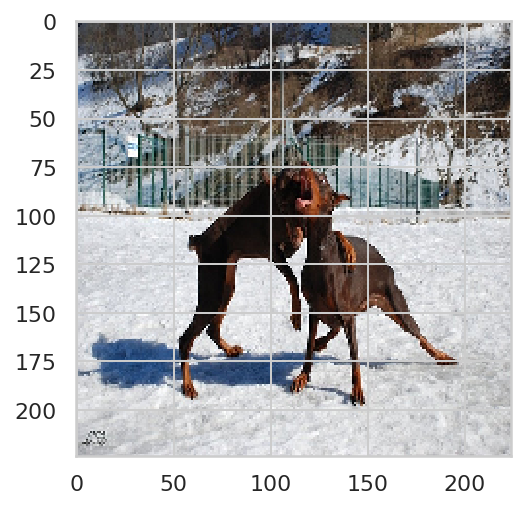

In [114]:
image = load_img('./dataset/Flicker8k_Dataset/' + test_image_filenames[0], target_size=(224, 224))
plt.imshow(image)

In [108]:
image_description= inference(test_images_features[test_image_filenames[0]].reshape(1, -1), final_model)
image_description

' a dog is laying on his hind legs .'

In [116]:
np.random.()

array([-1.03014149,  0.15429724, -0.17305256, -0.87030605,  0.808479  ])

In [156]:
import time
def test_models(model, num_test):
    np.random.seed(int(time.time()))
    plt.figure(figsize=(40, 20))
    test_index = np.random.randint(len(test_images_features), size=num_test)
    for index, pic_num in enumerate(test_index):
        plt.subplot(num_test//2 , 2, index+1)
        image = load_img('./dataset/Flicker8k_Dataset/' + test_image_filenames[pic_num], target_size=(224, 224))
        result = inference(test_images_features[test_image_filenames[pic_num]].reshape(1, -1), model)
        plt.imshow(image)
        plt.xlabel(test_image_filenames[pic_num] + ':  '+ result)

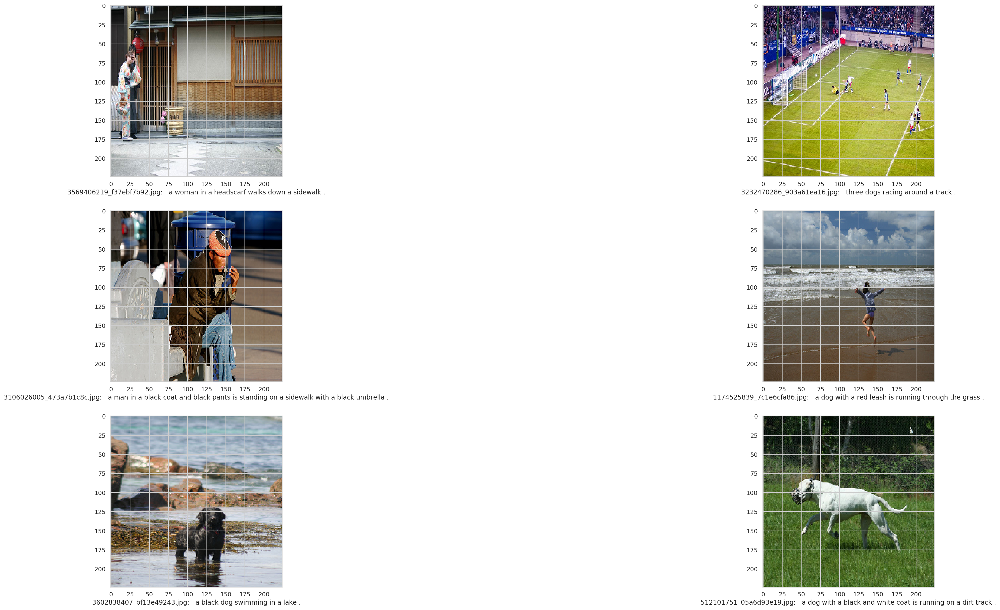

In [158]:
test_models(final_model, 6)

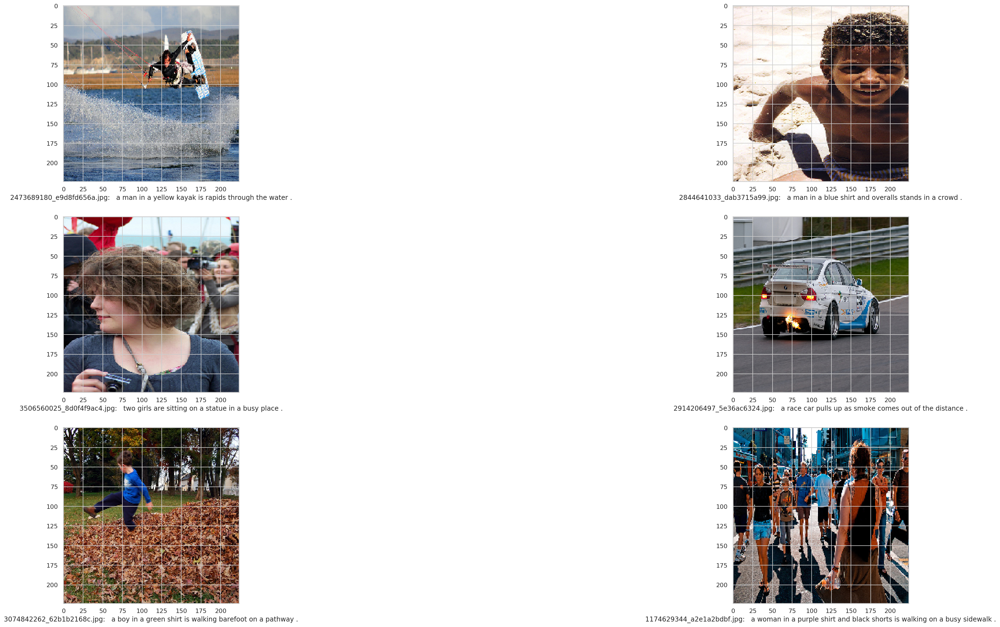

In [159]:
test_models(final_model, 6)

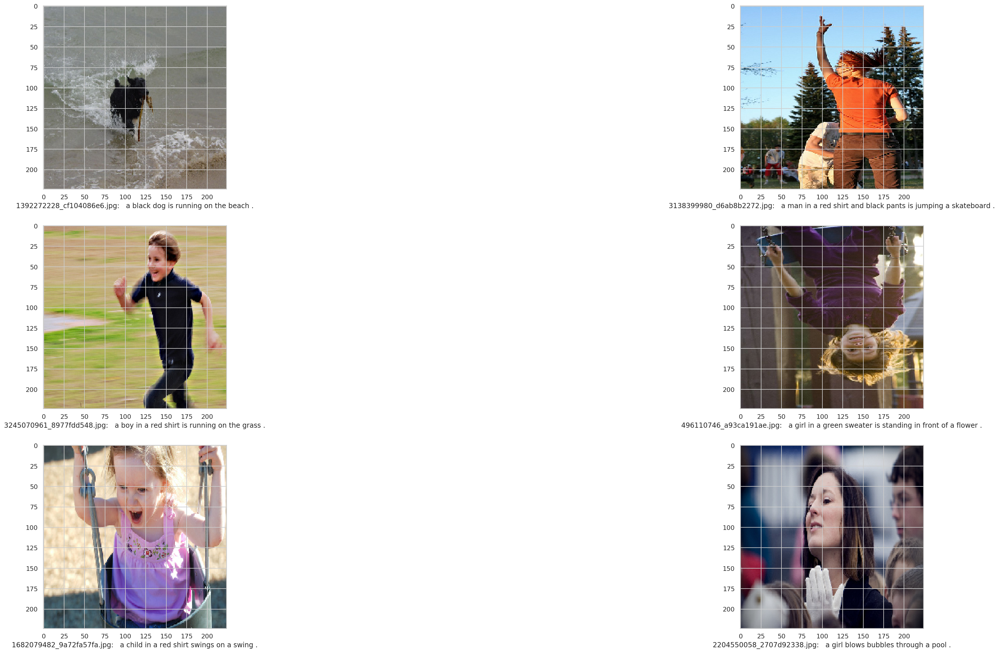

In [160]:
test_models(final_model, 6)

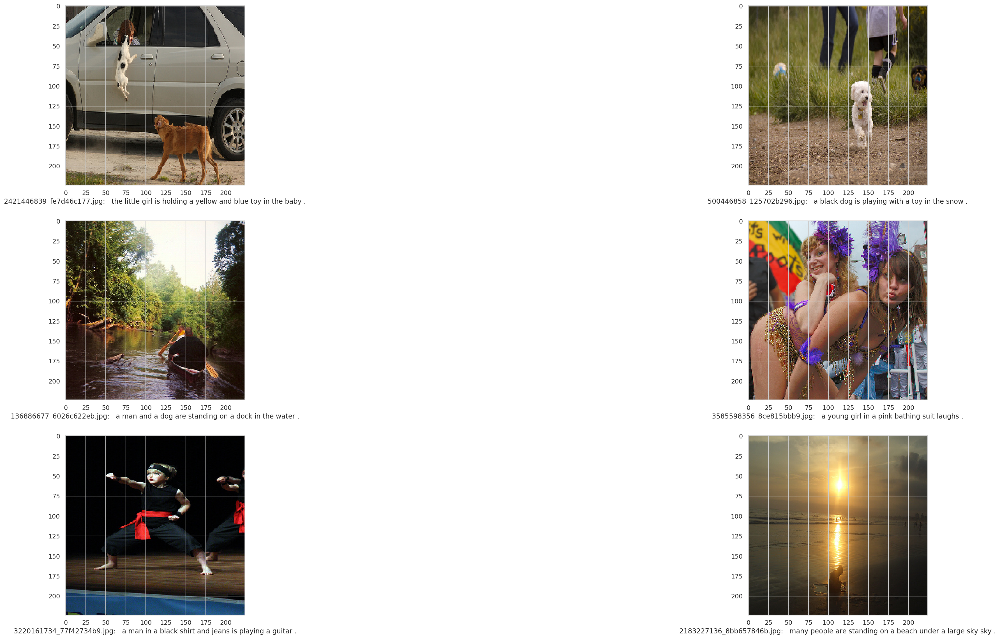

In [161]:
test_models(final_model, 6)

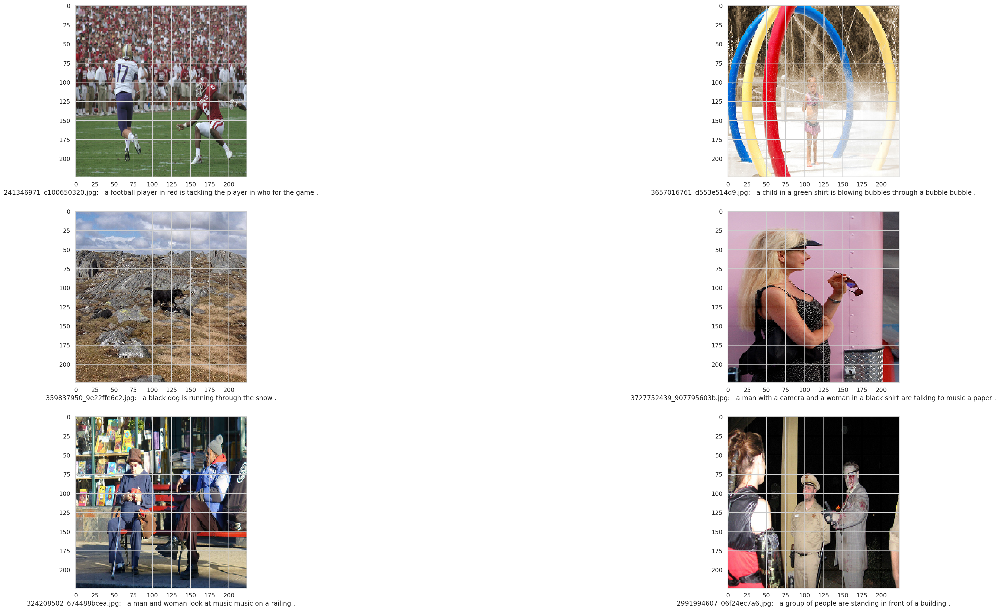

In [162]:
test_models(final_model, 6)


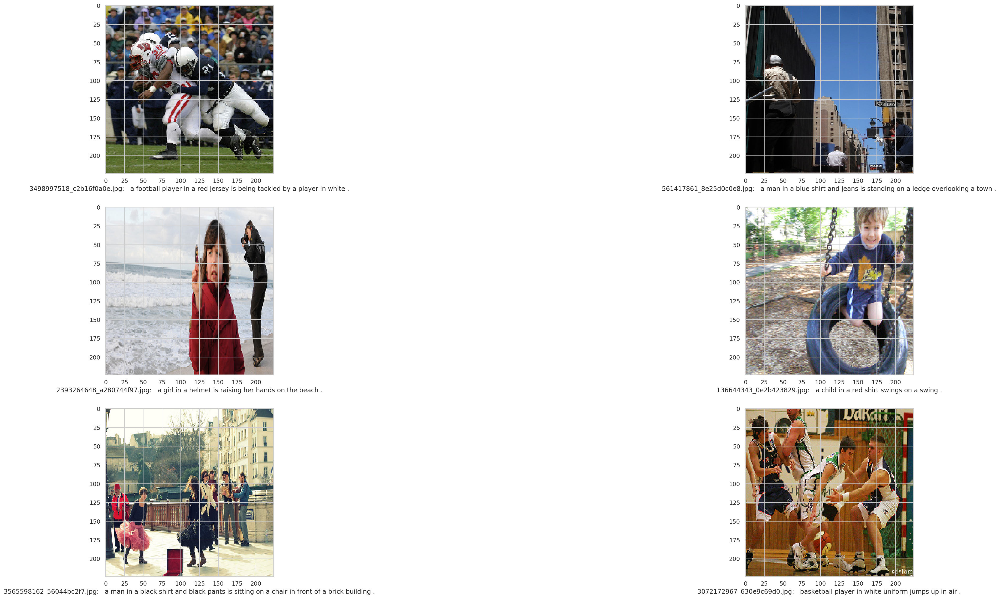

In [163]:
test_models(final_model, 6)

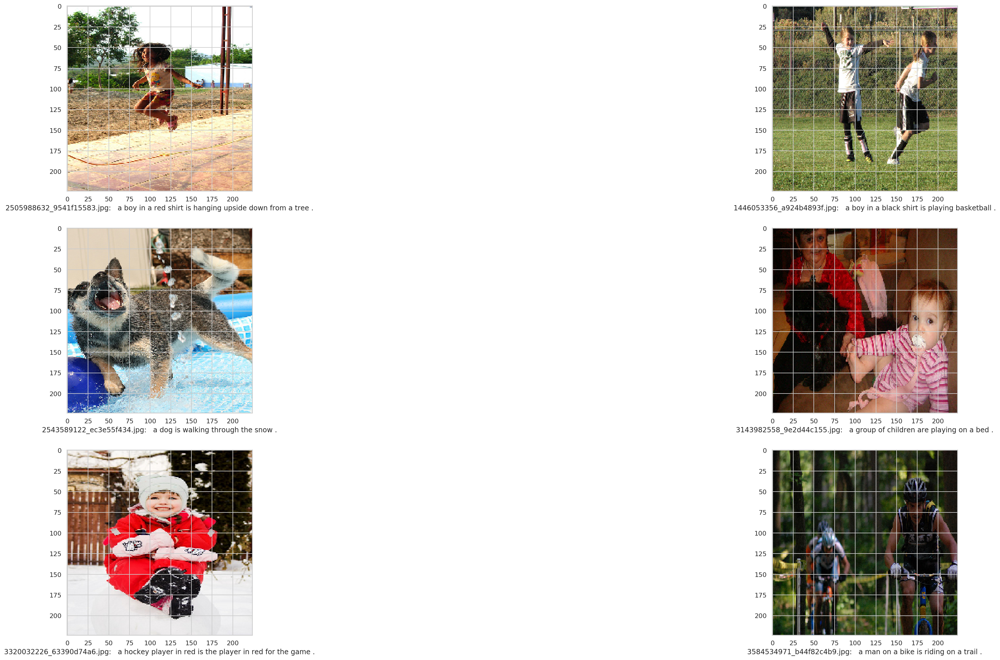

In [164]:
test_models(final_model, 6)

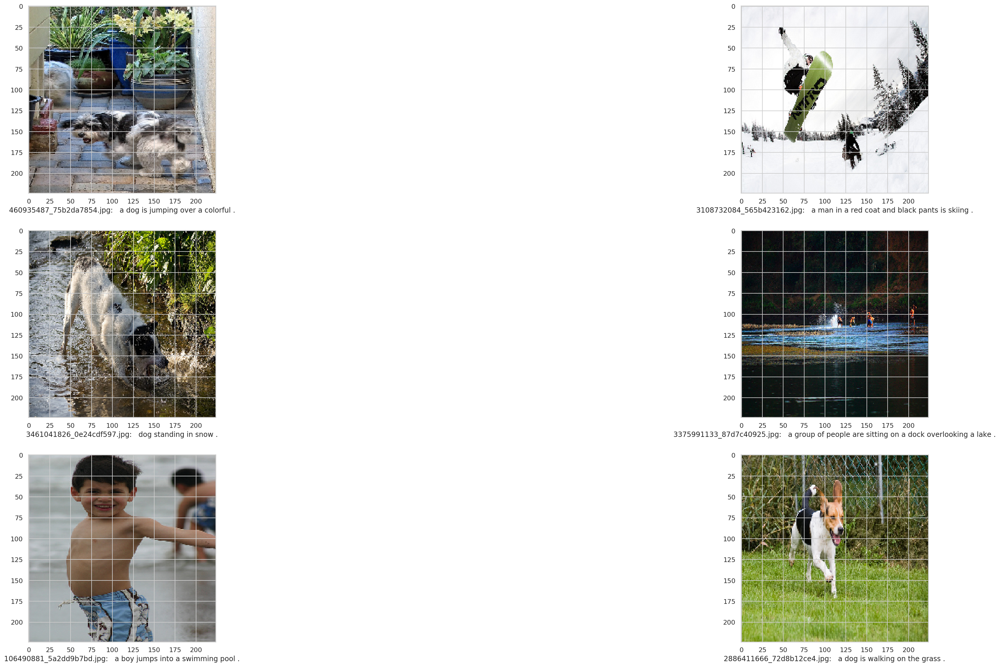

In [165]:
test_models(final_model, 6)